<!-- Notebook Header Start -->

<h1 align="center">Rat Trial DW333</h1>

<p align="center">
  <strong>Author:</strong> Karl Bates<br>
  <strong>Date:</strong> 2024-11-29<br>
  <strong>Affiliation:</strong> Carnegie Mellon University, Cohen-Karni Lab  || Neuromechatronics Lab
</p>

---


## 📊 Notebook Outline

* **Import Intan data in RHD format**
* **Package raw data into binary for Kilosort**
* **Run Kilosort to extract spike activity**
* **Calculate average firing rate of each cluster during a window of time.**

## 📚 References & Additional Resources

- [Kilosort4 docs](https://github.com/MouseLand/Kilosort/tree/main)
- [SpikeInterface docs](https://github.com/SpikeInterface)

---

<!-- Notebook Header End -->


# 📈 Importing Libraries & Data
---

### imports

In [1]:
# standard imports
from pathlib import Path
import os
import pandas as pd
import numpy as np
from kilosort import io
import matplotlib.pyplot as plt

# custom imports
from automations import RM1
from automations import SpikeInterface_wrapper
from automations import Kilosort_wrapper
from automations import plots

### probe definition

Using the spreadsheet, `Adapter_pinout.xlsx`, the contact ID's can be traced to the "device channel", and we can assign them on the probe. 

In this case, our channel indices correspond to the aux inputs to the intan headstage.

refer to the notebook, `RM1_pipeline.ipynb` within  the `dev_notebook` folder

In [2]:
# Path definitions

# save data to the inbox; make sure that the folders: binary & figures exist
SAVE_DIRECTORY = Path(fr'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333')  # NOTE Specify the path where the data will be copied to, and where Kilosort4 results will be saved.

# in this case, the data is saved in a folder with multiple rats
DATA_DIRECTORY = Path(fr'D:\Data\CMU.80 Data\82 External Data\82.002 Sample Rat Data from RM1 Project')  # NOTE Specify the path where the data will be copied to, and where Kilosort4 results will be saved.
# Create path if it doesn't exis    t
DATA_DIRECTORY.mkdir(parents=True, exist_ok=True)
SAVE_DIRECTORY.mkdir(parents=True, exist_ok=True)
PROBE_DIRECTORY = Path(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.001 A1x32-Edge-5mm-20-177-A32\A1x32-Edge-5mm-20-177-A32.prb')

# 🔁 Identifying an experiment for initial analysis

This is used to determine which trial is most likely to produce good units in a spike sorting analysis

---

### filepath definitions

In [3]:
channel_mapping = pd.read_excel(r"D:\Data\CMU.80 Data\88 Analyzed Data\88.001 A1x32-Edge-5mm-20-177-A32\Adapter_pinout.xlsx",
                                sheet_name="summary",
                                header=2).iloc[:,[8,10,12,14]]
channel_mapping.head(5)

,A1x32 Probe.1,A32->O32 Adapter.1,Intan Board,Intan Input.1
0,32,32,T13,19
1,31,30,T14,20
2,30,31,B13,28
3,29,28,T15,21
4,28,29,B14,27


### importing the rat

In [4]:
Rat = RM1.Rat(DATA_DIRECTORY, PROBE_DIRECTORY, "DW333")

Reading qsttest_1_241115_150618...
Error reading stream 2 for qsttest_1_241115_150618. continuing...
Reading qsttest_1_241115_151239...
Error reading stream 2 for qsttest_1_241115_151239. continuing...
Reading qsttest_1_241115_151523...
Error reading stream 2 for qsttest_1_241115_151523. continuing...
Reading qst_1_241115_152031...
Error reading stream 2 for qst_1_241115_152031. continuing...
Reading qst_1_241115_152346...
Error reading stream 2 for qst_1_241115_152346. continuing...
Reading qst_1_241115_152800...
Error reading stream 2 for qst_1_241115_152800. continuing...
Reading VF_DRG_1_241115_145120...
Error reading stream 2 for VF_DRG_1_241115_145120. continuing...
Reading VF_DRG_1_241115_145435...
Error reading stream 2 for VF_DRG_1_241115_145435. continuing...
Reading VF_DRG_1_241115_145739...
Error reading stream 2 for VF_DRG_1_241115_145739. continuing...
Reading VF_DRG_4_241115_153512...
Error reading stream 2 for VF_DRG_4_241115_153512. continuing...
Reading VF_DRG_4_24111

In [5]:
# for example, pulling the amp data from the 7th DRGS trial (only works for DW333)
# DW322.mat_files_dict["VF_DRG__145435"]["AM"]["amp"][0, 0][0, 0]

In [6]:
Rat.drgs_experiment_notes

'spike neuro probe in DRG'

In [7]:
Rat.drgs_trial_notes.head()

5,Trial Number,Condition,amp (uA),PW (us),Freq. (Hz),Dur. (s),Stimuli,Stage,Stimuli Dur.,rcrtrange,waitime
Trial Number,,,,,,,,,,,
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
Rat.get_sc_data()

### process data for import into Kilosort

I will use a combination of `SpikeInterface` & `Kilosort.io.extractors` to get the data I need

In [9]:
signals = SpikeInterface_wrapper(Rat, SAVE_DIRECTORY)

Preparing SpikeInterface wrapper for rat DW333


In [10]:
# VF_DRG_pre = "VF_DRG_1_241115_145120"
VF_DRG_pre = "qst_1_241115_152031"
VF_DRG_post = "VF_DRG_1_241115_145739"

In [11]:
recording_pre = signals.data.intan_recordings_stream0[VF_DRG_pre]
digital_trace_pre = signals.data.intan_recordings_stream4[VF_DRG_pre].get_traces(channel_ids=['DIGITAL-IN-01'])
von_frey_pre = signals.data.intan_recordings_stream3[VF_DRG_pre]

In [12]:
recording_post = signals.data.intan_recordings_stream0[VF_DRG_post]
digital_trace_post = signals.data.intan_recordings_stream4[VF_DRG_post].get_traces(channel_ids=['DIGITAL-IN-01'])
von_frey_post = signals.data.intan_recordings_stream3[VF_DRG_post]

gain_to_uV: 312.5, offset_to_uV: -10240000.0


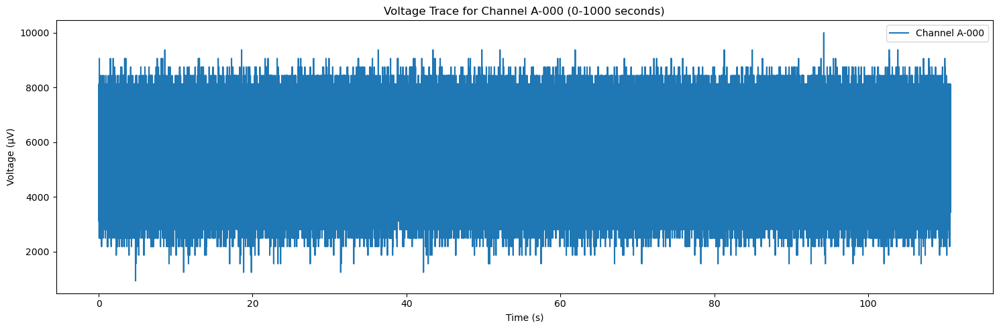

In [13]:
plots.static_trace(von_frey_pre,channel_id='ANALOG-IN-2',start_time=0, end_time=1000)

In [14]:
plots.interactive_trace(recording_post)

gain_to_uV: 0.195, offset_to_uV: -6389.76


gain_to_uV: 312.5, offset_to_uV: -10240000.0


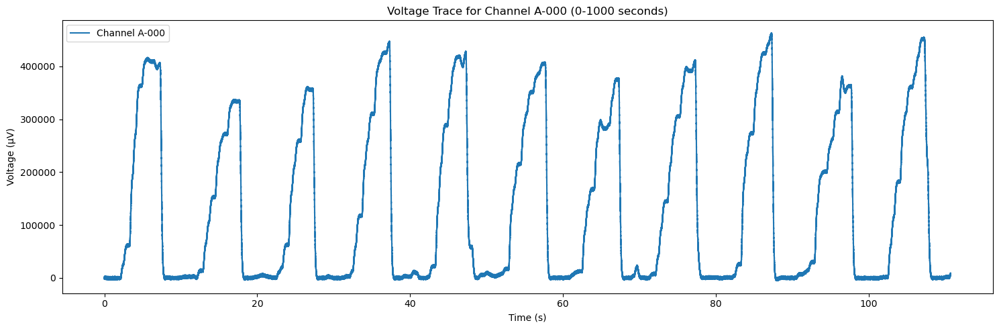

In [15]:
plots.static_trace(von_frey_post,channel_id='ANALOG-IN-2',start_time=0, end_time=1000)

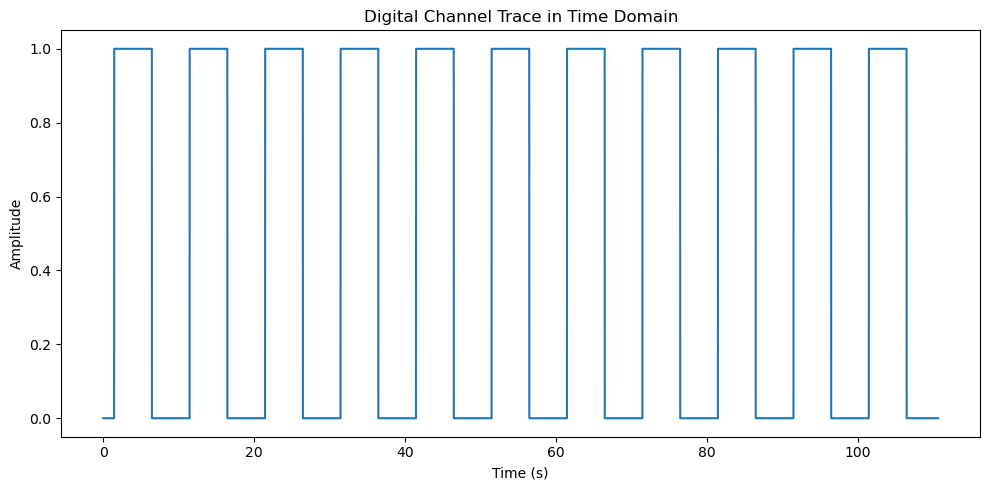

In [16]:
# Calculate the time vector
sampling_rate = 30000  # in Hz
num_samples = len(digital_trace_pre)
time_vector = np.arange(num_samples) / sampling_rate  # Time in seconds

# Plot the digital trace in the time domain
plt.figure(figsize=(10, 5))
plt.plot(time_vector, digital_trace_pre)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Digital Channel Trace in Time Domain')
plt.tight_layout()
plt.show()


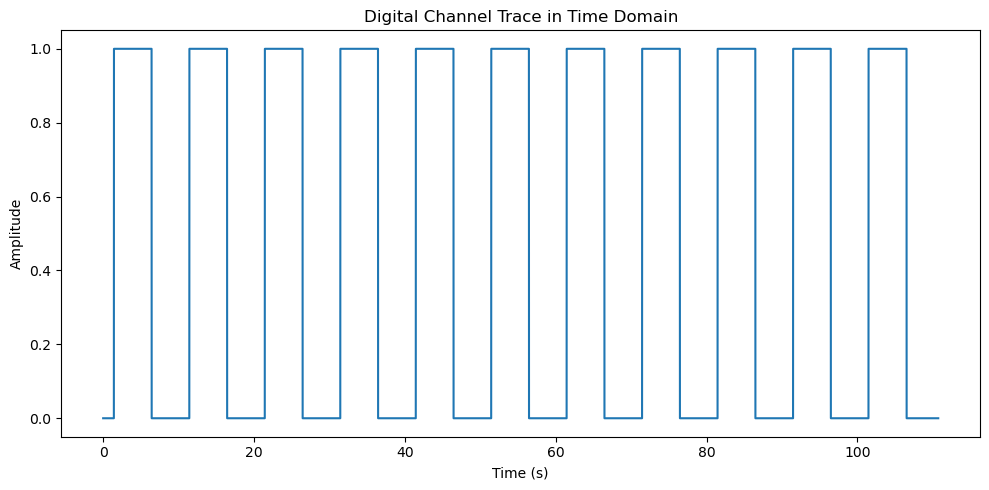

In [17]:
# Calculate the time vector
sampling_rate = 30000  # in Hz
num_samples = len(digital_trace_post)
time_vector = np.arange(num_samples) / sampling_rate  # Time in seconds

# Plot the digital trace in the time domain
plt.figure(figsize=(10, 5))
plt.plot(time_vector, digital_trace_post)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Digital Channel Trace in Time Domain')
plt.tight_layout()
plt.show()

# Extract windows of time where Von Frey stimulus is applied, calculate average stimulus and ECAP

In [18]:
# Assuming you have already imported the necessary libraries and loaded your data
# Replace 'digital_trace_pre', 'von_frey_pre', and 'recording_pre' with your actual variables

# Flatten the digital trace to a 1D array
digital_trace = digital_trace_pre.flatten()

# Threshold the digital trace to ensure it's binary (0 or 1)
threshold = 0.5  # Adjust based on your data
digital_trace_binary = (digital_trace > threshold).astype(int)

# Find indices where the digital trace goes from low to high (rising edge)
rising_edges = np.where((digital_trace_binary[:-1] == 0) & (digital_trace_binary[1:] == 1))[0] + 1  # +1 to correct index

# Find indices where the digital trace goes from high to low (falling edge)
falling_edges = np.where((digital_trace_binary[:-1] == 1) & (digital_trace_binary[1:] == 0))[0] + 1

# Handle cases where the trace starts high
if digital_trace_binary[0] == 1:
    rising_edges = np.insert(rising_edges, 0, 0)

# Handle cases where the trace ends high
if digital_trace_binary[-1] == 1:
    falling_edges = np.append(falling_edges, len(digital_trace_binary) - 1)

# Ensure that the number of rising and falling edges matches
if len(rising_edges) > len(falling_edges):
    rising_edges = rising_edges[:len(falling_edges)]
elif len(falling_edges) > len(rising_edges):
    falling_edges = falling_edges[:len(rising_edges)]

# Now, we can define the time windows
sampling_rate = recording_pre.get_sampling_frequency()
start_times = rising_edges / sampling_rate
end_times = falling_edges / sampling_rate

# Define buffers in seconds
start_buffer = 0.002  # Time to add to the start of each interval
end_buffer = 0.001    # Time to subtract from the end of each interval

# Adjust the time windows
adjusted_start_times = start_times + start_buffer
adjusted_end_times = end_times - end_buffer

# Ensure that the adjusted times are within valid bounds
valid_indices = adjusted_start_times < adjusted_end_times

# Apply the valid indices to filter out any invalid intervals
adjusted_start_times = adjusted_start_times[valid_indices]
adjusted_end_times = adjusted_end_times[valid_indices]

# Convert adjusted times back to sample indices
adjusted_start_indices = (adjusted_start_times * sampling_rate).astype(int)
adjusted_end_indices = (adjusted_end_times * sampling_rate).astype(int)

# Ensure indices are within the valid range
num_samples = len(digital_trace_binary)
adjusted_start_indices = np.clip(adjusted_start_indices, 0, num_samples - 1)
adjusted_end_indices = np.clip(adjusted_end_indices, 0, num_samples - 1)

# Get Von Frey data (assuming 'ANALOG-IN-2' is the correct channel)
von_frey_data = von_frey_pre.get_traces(channel_ids=['ANALOG-IN-2'],return_scaled=True).flatten()

# Get recording data (all channels or specify channel_ids as needed)
recording_data = recording_pre.get_traces(return_scaled=True)

# Initialize lists to store averages
von_frey_averages = []
recording_averages = []

# Loop over each adjusted time window
for start_idx, end_idx in zip(adjusted_start_indices, adjusted_end_indices):
    # Extract data segments corresponding to the adjusted time window
    von_frey_segment = von_frey_data[start_idx:end_idx]
    recording_segment = recording_data[start_idx:end_idx, :]  # All channels during the time window

    # Compute averages
    von_frey_avg = np.mean(von_frey_segment)
    recording_avg = np.mean(recording_segment, axis=0)  # Average across time for each channel

    # Store the averages
    von_frey_averages.append(von_frey_avg)
    recording_averages.append(recording_avg)

# Convert lists to arrays for easier manipulation
von_frey_averages = np.array(von_frey_averages)
recording_averages = np.array(recording_averages)

# Now you have the average Von Frey and recording responses during the adjusted intervals
print("Adjusted Time Windows:")
print(np.column_stack((adjusted_start_times, adjusted_end_times)))

print("Average Von Frey responses during adjusted intervals:")
print(von_frey_averages)

print("Average recording responses during adjusted intervals (per channel):")
print(recording_averages)


Adjusted Time Windows:
[[  1.45486667   6.45133333]
 [ 11.4563      16.4552    ]
 [ 21.46156667  26.4609    ]
 [ 31.46383333  36.46346667]
 [ 41.46703333  46.46663333]
 [ 51.4829      56.46953333]
 [ 61.4733      66.47096667]
 [ 71.47493333  76.4731    ]
 [ 81.48173333  86.4825    ]
 [ 91.49733333  96.48293333]
 [101.48696667 106.48666667]]
Average Von Frey responses during adjusted intervals:
[5679.626  5696.5913 5734.195  5731.136  5762.221  5724.2773 5703.6943
 5729.4136 5715.068  5718.5312 5691.353 ]
Average recording responses during adjusted intervals (per channel):
[[  6.4377365    5.4280643    6.49264      6.303173     6.20728
    6.3695874    6.252789     5.7250233    8.588052     2.29765
    8.195849     5.6525674    7.137296     7.3729177    7.4113374
    7.6184855    7.175222     6.5179496    6.6559634    5.7076426
    5.743913     6.1815886    6.397762     6.152981    -8.1467
  -20.835997   -57.874226    -2.5036016    5.161209     8.026529
    7.8010654    7.079344  ]
 [ -

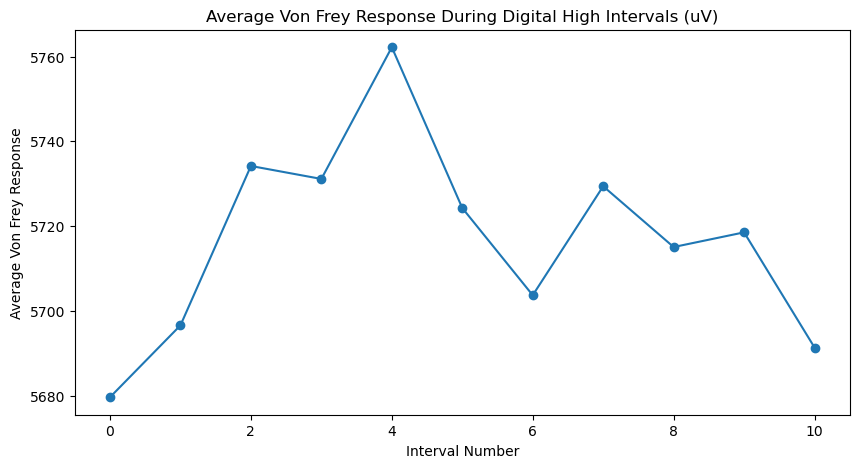

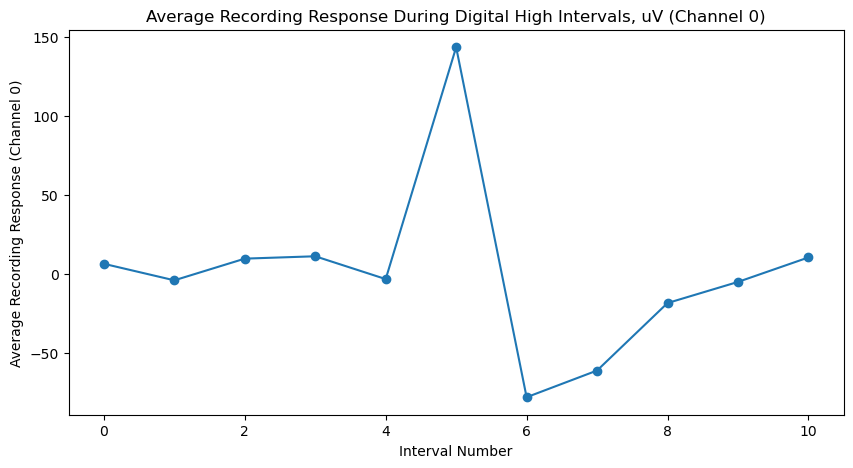

In [19]:
channel_number = 1  # Change to the channel you're interested in

# Plot the average Von Frey response during each interval
plt.figure(figsize=(10, 5))
plt.plot(von_frey_averages, marker='o')
plt.xlabel('Interval Number')
plt.ylabel('Average Von Frey Response')
plt.title('Average Von Frey Response During Digital High Intervals (uV)')
plt.show()

# Plot the average recording response for a specific channel (e.g., channel 0)
channel_number = 0  # Change to the channel you're interested in
plt.figure(figsize=(10, 5))
plt.plot(recording_averages[:, channel_number], marker='o')
plt.xlabel('Interval Number')
plt.ylabel(f'Average Recording Response (Channel {channel_number})')
plt.title(f'Average Recording Response During Digital High Intervals, uV (Channel {channel_number})')
plt.show()


# 🖼 Export Results to binary and run Kilosort trial summary

### run trial review

In [20]:
# signals.save_spinalcord_data_to_binary(TRIAL_NAMES=["VF_8_241125_161626",
# #                                                      ])
# signals.save_spinalcord_data_to_binary()

spikes = Kilosort_wrapper(SAVE_DIRECTORY, PROBE_DIRECTORY)

# NOTE: running the trial summary will take some time. I've commented it out. if you need to generate kilosort outputs, then uncomment
# spikes.run_kilosort_trial_summary()

Preparing Kilosort wrapper...


### import results from kilosort to run further analysis

In [21]:
spikes.extract_kilosort_outputs()

Kilosort outputs successfully loaded for trial: qsttest_1_241115_150618
Kilosort outputs successfully loaded for trial: qsttest_1_241115_151239
Kilosort outputs successfully loaded for trial: qsttest_1_241115_151523
Kilosort outputs successfully loaded for trial: qst_1_241115_152031
Kilosort outputs successfully loaded for trial: qst_1_241115_152346
Kilosort outputs successfully loaded for trial: qst_1_241115_152800
Kilosort outputs successfully loaded for trial: VF_DRG_1_241115_145120
Kilosort outputs successfully loaded for trial: VF_DRG_1_241115_145435
Kilosort outputs successfully loaded for trial: VF_DRG_1_241115_145739
Kilosort outputs successfully loaded for trial: VF_DRG_4_241115_153512
Kilosort directory not found for trial: VF_DRG_4_241115_170440


- **`ops`**: Loads the Kilosort options dictionary, which includes parameters and processing information.
- **`cluster_amplitudes` & `contamination_percentage`**: Load cluster amplitudes and contamination percentages from TSV files.
- **`channel_mapping`**: Loads the mapping of electrode channels.
- **`templates`**: Loads the spike waveform templates.
- **`chan_best`**: Identifies the best (most representative) channel for each template by finding the channel with the maximum energy (sum of squared amplitudes).
- **`amplitudes`**: Loads the amplitudes of detected spikes.
- **`spike_times`**: Loads spike times, typically in sample indices.
- **`spike_clusters`**: Loads cluster assignments for each spike.
- **`firing_rates`**: Calculates the firing rate for each unit (cluster) by counting the number of spikes and normalizing by the total recording time.
- **`dshift`**: Extracts the drift shift values from the options dictionary, which indicates the movement of the recording probe over time.

In [22]:
spikes.kilosort_results["VF_DRG_1_241115_145739"]["ops"]

{'n_chan_bin': 32,
 'fs': 30000,
 'batch_size': 60000,
 'nblocks': 1,
 'Th_universal': 9,
 'Th_learned': 8,
 'tmin': 0,
 'tmax': inf,
 'nt': 61,
 'shift': None,
 'scale': None,
 'artifact_threshold': inf,
 'nskip': 25,
 'whitening_range': 32,
 'highpass_cutoff': 300,
 'binning_depth': 5,
 'sig_interp': 20,
 'drift_smoothing': [0.5, 0.5, 0.5],
 'nt0min': 20,
 'dmin': 20.0,
 'dminx': 32,
 'min_template_size': 10,
 'template_sizes': 5,
 'nearest_chans': 10,
 'nearest_templates': 100,
 'max_channel_distance': 32,
 'templates_from_data': True,
 'n_templates': 6,
 'n_pcs': 6,
 'Th_single_ch': 6,
 'acg_threshold': 0.2,
 'ccg_threshold': 0.25,
 'cluster_downsampling': 20,
 'x_centers': None,
 'duplicate_spike_ms': 0.25,
 'data_dir': 'D:\\Data\\CMU.80 Data\\88 Analyzed Data\\88.003 Initial Analysis, DW333\\binary\\VF_DRG_1_241115_145739',
 'filename': 'D:\\Data\\CMU.80 Data\\88 Analyzed Data\\88.003 Initial Analysis, DW333\\binary\\VF_DRG_1_241115_145739\\DW333_VF_DRG_1_241115_145739_data.bin',

Firing Rates during Adjusted Intervals (Hz):
           0          1          2          3          4          5   \
0   34.224185  26.018386  33.023336  22.015558  21.615275  23.416548   
1   26.005721  14.803257  20.804577  13.002861  15.003301  20.804577   
2   26.603547  10.601414  24.603280  17.602347  18.202427  16.802240   
3   25.401863  18.601364  25.801892  21.401569  18.401349  19.601437   
4   22.801824  18.201456  26.402112  14.601168  17.401392  15.401232   
5   19.251466   5.815547  13.435919   5.815547  10.628413  16.845032   
6   11.205229  13.406256  11.405322  11.805509   9.604482   9.604482   
7   14.805429   3.801394  14.005135   9.203375   9.603521   9.803595   
8   27.995707  12.398099  25.996014  18.797118  14.997700  22.396566   
9   20.258344   8.825417  21.662388   7.421374  14.441592  17.450257   
10  30.201812  12.200732  23.201392  22.601356  18.201092  19.001140   

           6          7          8          9   ...         22         23  \
0   33.023336

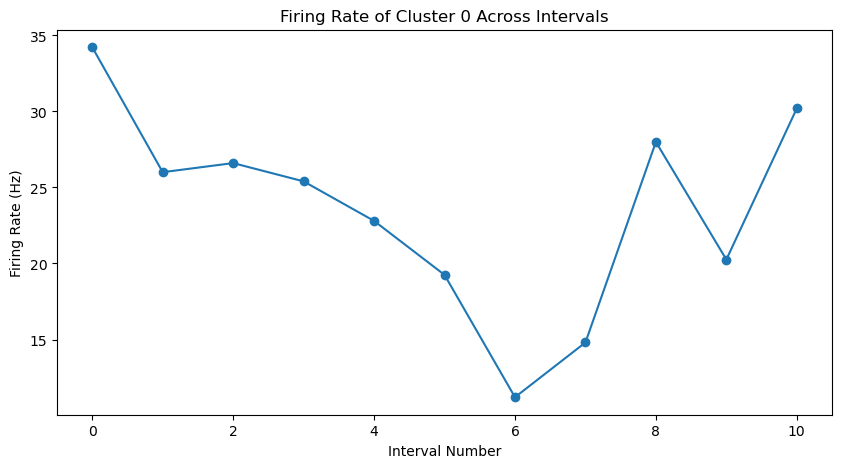

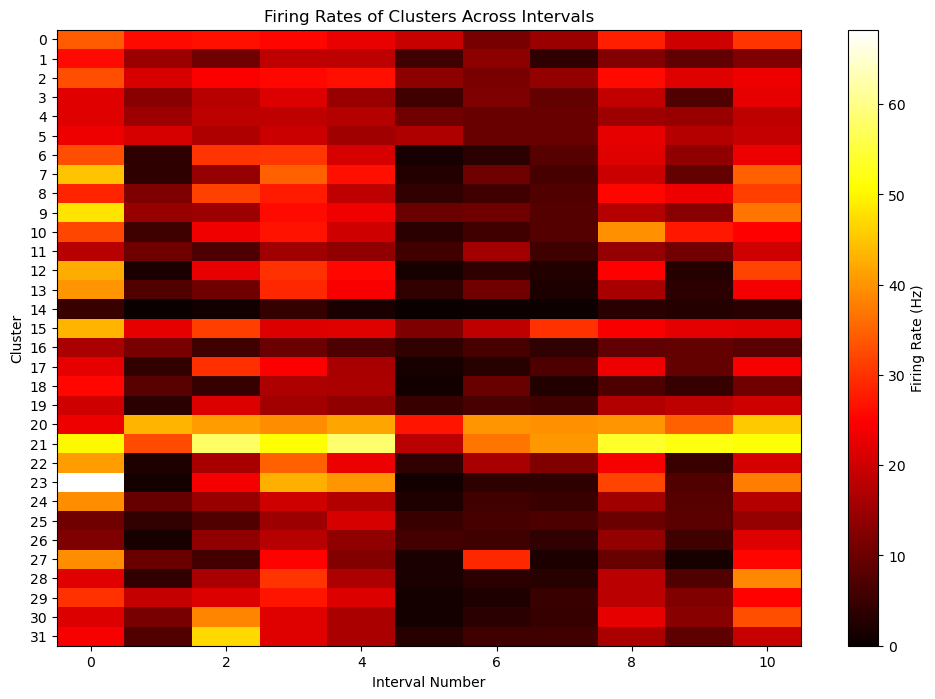

In [23]:
from collections import Counter
# Get spike times and clusters from Kilosort results
# Assuming the results are stored in spikes.kilosort_results
# Use the appropriate trial name
trial_name = VF_DRG_pre  # Ensure this matches your actual trial name in kilosort_results
kilosort_output = spikes.kilosort_results[trial_name]

st = kilosort_output['spike_times']  # Spike times in samples
clu = kilosort_output['spike_clusters']  # Cluster assignments
sampling_rate_kilosort = kilosort_output['ops']['fs']  # Sampling rate used in Kilosort (should match)

# Convert spike times to seconds
spike_times_sec = st / sampling_rate_kilosort

# Initialize a list to store firing rates per interval
firing_rates_intervals = []

# Loop over each adjusted time window
for start_time, end_time in zip(adjusted_start_times, adjusted_end_times):
    # Find spikes within the time window
    indices_in_window = np.where((spike_times_sec >= start_time) & (spike_times_sec < end_time))[0]
    spikes_in_window = st[indices_in_window]
    clusters_in_window = clu[indices_in_window]
    
    # Calculate the duration of the interval
    window_duration = end_time - start_time  # In seconds
    
    # Count the number of spikes per cluster within the window
    cluster_spike_counts = Counter(clusters_in_window)
    
    # Get all clusters present in the entire recording
    all_clusters = np.unique(clu)
    
    # Initialize firing rates with zero for all clusters
    firing_rates = {cluster: 0 for cluster in all_clusters}
    
    # Compute firing rates for clusters present in the window
    for cluster in all_clusters:
        count = cluster_spike_counts.get(cluster, 0)
        firing_rates[cluster] = count / window_duration  # Firing rate in Hz
    
    # Append the firing rates dictionary to the list
    firing_rates_intervals.append(firing_rates)

# Convert the list of dictionaries to a DataFrame
# Each row corresponds to an interval, columns are clusters
firing_rates_df = pd.DataFrame(firing_rates_intervals)

# Optionally, fill NaN values with zeros (clusters not firing in an interval)
firing_rates_df = firing_rates_df.fillna(0)

# Display the firing rates DataFrame
print("Firing Rates during Adjusted Intervals (Hz):")
print(firing_rates_df)

# Plotting the firing rates for a specific cluster across intervals
cluster_to_plot = all_clusters[0]  # Replace with the cluster you're interested in
plt.figure(figsize=(10, 5))
plt.plot(firing_rates_df[cluster_to_plot], marker='o')
plt.xlabel('Interval Number')
plt.ylabel('Firing Rate (Hz)')
plt.title(f'Firing Rate of Cluster {cluster_to_plot} Across Intervals')
plt.show()

# Optionally, plot the firing rates of all clusters as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(firing_rates_df.T, aspect='auto', cmap='hot', interpolation='nearest')
plt.colorbar(label='Firing Rate (Hz)')
plt.xlabel('Interval Number')
plt.ylabel('Cluster')
plt.yticks(ticks=np.arange(len(all_clusters)), labels=all_clusters)
plt.title('Firing Rates of Clusters Across Intervals')
plt.show()

In [24]:
firing_rates_df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,34.224185,26.018386,33.023336,22.015558,21.615275,23.416548,33.023336,45.031822,28.620225,48.234085,...,41.028994,68.248229,39.227721,10.407355,11.808345,39.427862,22.015558,30.021215,21.415133,24.016972
1,26.005721,14.803257,20.804577,13.002861,15.003301,20.804577,3.800836,3.800836,11.802597,14.403169,...,2.200484,1.200264,9.402068,4.000880,1.400308,9.602112,4.200924,19.004181,11.202465,7.401628
2,26.603547,10.601414,24.603280,17.602347,18.202427,16.802240,30.204027,14.201894,31.604214,15.002000,...,16.002134,23.803174,14.401920,7.200960,13.801840,6.000800,16.202160,21.402854,38.605147,47.006268
3,25.401863,18.601364,25.801892,21.401569,18.401349,19.601437,30.602244,34.802552,27.602024,26.001907,...,34.802552,42.803139,20.201481,15.001100,17.601291,25.201848,30.202215,27.001980,21.801599,21.601584
4,22.801824,18.201456,26.402112,14.601168,17.401392,15.401232,21.001680,26.602128,18.201456,23.601888,...,23.001840,40.203216,17.201376,21.001680,13.801104,12.400992,16.601328,21.401712,16.401312,16.401312
5,19.251466,5.815547,13.435919,5.815547,10.628413,16.845032,1.403753,2.406433,4.010722,10.026805,...,4.010722,0.802144,2.205897,5.013402,6.016083,1.604289,1.604289,1.203217,1.203217,3.008041
6,11.205229,13.406256,11.405322,11.805509,9.604482,9.604482,3.401587,10.204762,5.602615,10.404856,...,16.207564,3.801774,5.602615,6.202895,5.402521,29.013540,3.601681,2.201027,3.401587,5.402521
7,14.805429,3.801394,14.005135,9.203375,9.603521,9.803595,7.802861,6.202274,7.202641,7.602788,...,12.204475,3.801394,5.001834,6.802494,4.201541,2.000734,3.001100,4.801761,4.601687,5.602054
8,27.995707,12.398099,25.996014,18.797118,14.997700,22.396566,21.796658,19.596995,25.396106,17.397332,...,23.996321,31.795125,15.397639,9.998467,13.997854,9.798498,17.997240,17.997240,22.396566,16.397486
9,20.258344,8.825417,21.662388,7.421374,14.441592,17.450257,13.839859,9.226573,23.267009,12.836970,...,4.813864,7.421374,7.822529,8.424262,5.415597,1.404044,7.421374,12.034660,12.836970,8.624840


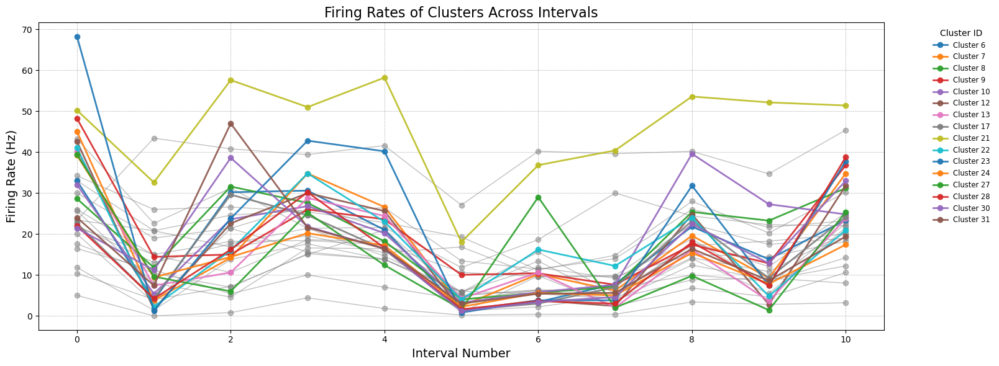

In [25]:

# Calculate the standard deviation for each cluster across intervals
std_firing_rates = firing_rates_df.std(axis=0)

# Determine a threshold for "significant change" in firing rate
# For example, clusters with a standard deviation greater than the median are highlighted
threshold = std_firing_rates.median()

# Identify units that show significant changes versus stable units
significant_units = std_firing_rates > threshold
stable_units = ~significant_units

# Plotting
plt.figure(figsize=(18, 6))

# Plot the stable units with low opacity and thinner lines
for cluster in firing_rates_df.columns[stable_units]:
    plt.plot(firing_rates_df[cluster], marker='o', linestyle='-', linewidth=1, alpha=0.5, color='gray')

# Plot the significant units with higher opacity and thicker lines
for cluster in firing_rates_df.columns[significant_units]:
    plt.plot(firing_rates_df[cluster], marker='o', linestyle='-', linewidth=2, alpha=0.9, label=f'Cluster {cluster}')

# Highlighting
plt.xlabel('Interval Number', fontsize=14)
plt.ylabel('Firing Rate (Hz)', fontsize=14)
plt.title('Firing Rates of Clusters Across Intervals', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Optional: Add a legend for clusters with significant changes outside the plot
plt.legend(title='Cluster ID', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1, fontsize='small', frameon=False)

# Adjust layout to accommodate the legend outside the plot
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the plot area to make space for the legend

plt.show()


# refactoring

Reading qsttest_1_241115_150618...
Error reading stream 2 for qsttest_1_241115_150618. continuing...
Reading qsttest_1_241115_151239...
Error reading stream 2 for qsttest_1_241115_151239. continuing...
Reading qsttest_1_241115_151523...
Error reading stream 2 for qsttest_1_241115_151523. continuing...
Reading qst_1_241115_152031...
Error reading stream 2 for qst_1_241115_152031. continuing...
Reading qst_1_241115_152346...
Error reading stream 2 for qst_1_241115_152346. continuing...
Reading qst_1_241115_152800...
Error reading stream 2 for qst_1_241115_152800. continuing...
Reading VF_DRG_1_241115_145120...
Error reading stream 2 for VF_DRG_1_241115_145120. continuing...
Reading VF_DRG_1_241115_145435...
Error reading stream 2 for VF_DRG_1_241115_145435. continuing...
Reading VF_DRG_1_241115_145739...
Error reading stream 2 for VF_DRG_1_241115_145739. continuing...
Reading VF_DRG_4_241115_153512...
Error reading stream 2 for VF_DRG_4_241115_153512. continuing...
Reading VF_DRG_4_24111

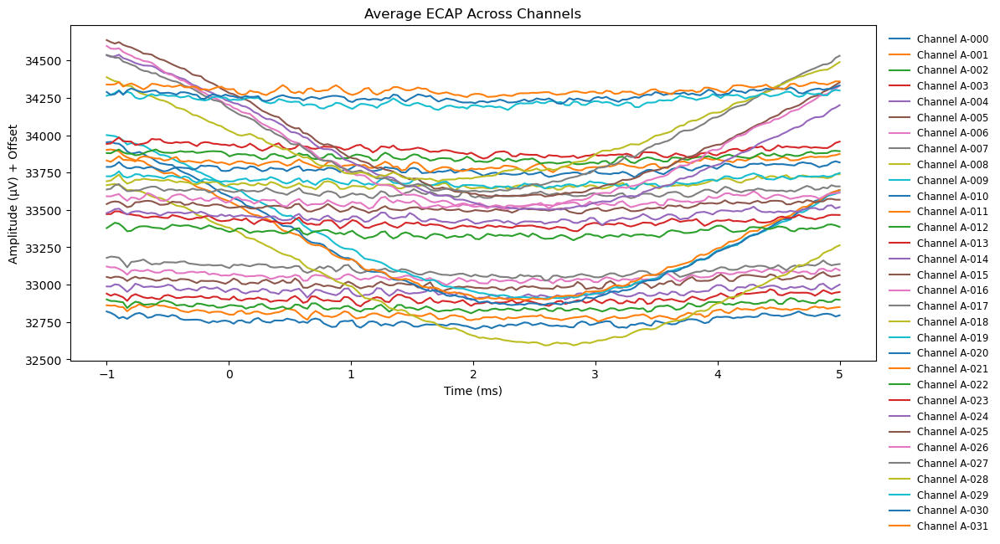

Error processing Kilosort outputs: [WinError 3] The system cannot find the path specified: 'D:\\Data\\CMU.80 Data\\88 Analyzed Data\\binary'
Kilosort results not found for trial VF_DRG_1_241115_145120.


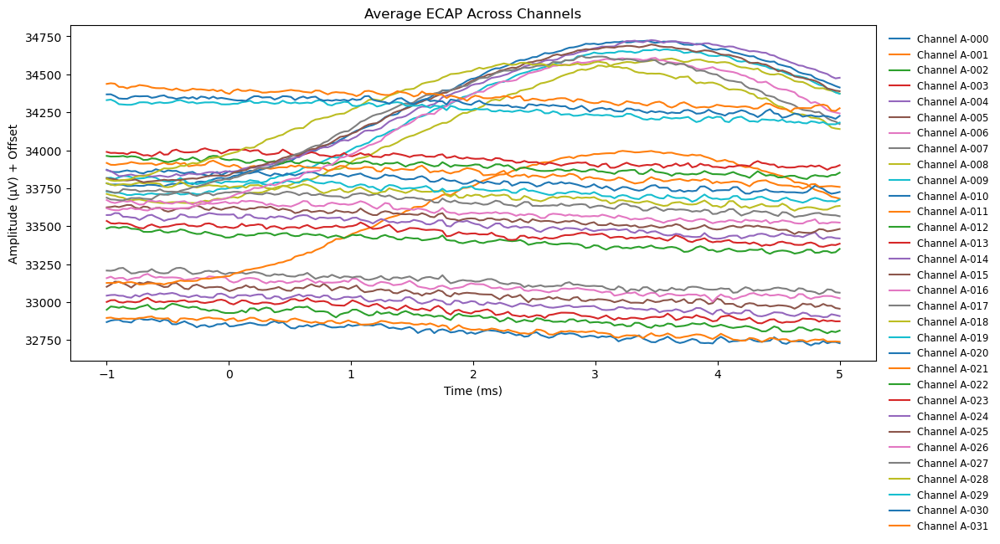

Error processing Kilosort outputs: [WinError 3] The system cannot find the path specified: 'D:\\Data\\CMU.80 Data\\88 Analyzed Data\\binary'
Kilosort results not found for trial VF_DRG_1_241115_145739.
Reading DRGS_10_240911_155921...
Error reading stream 2 for DRGS_10_240911_155921. continuing...
Reading DRGS_11_240911_160638...
Error reading stream 2 for DRGS_11_240911_160638. continuing...
Reading DRGS_1_240911_144910...
Error reading stream 2 for DRGS_1_240911_144910. continuing...
Reading DRGS_2_240911_145808...
Error reading stream 2 for DRGS_2_240911_145808. continuing...
Reading DRGS_3_240911_150506...
Error reading stream 2 for DRGS_3_240911_150506. continuing...
Reading DRGS_4_240911_151137...
Error reading stream 2 for DRGS_4_240911_151137. continuing...
Reading DRGS_5_240911_151925...
Error reading stream 2 for DRGS_5_240911_151925. continuing...
Reading DRGS_6_240911_152522...
Error reading stream 2 for DRGS_6_240911_152522. continuing...
Reading DRGS_7_240911_153255...
Er

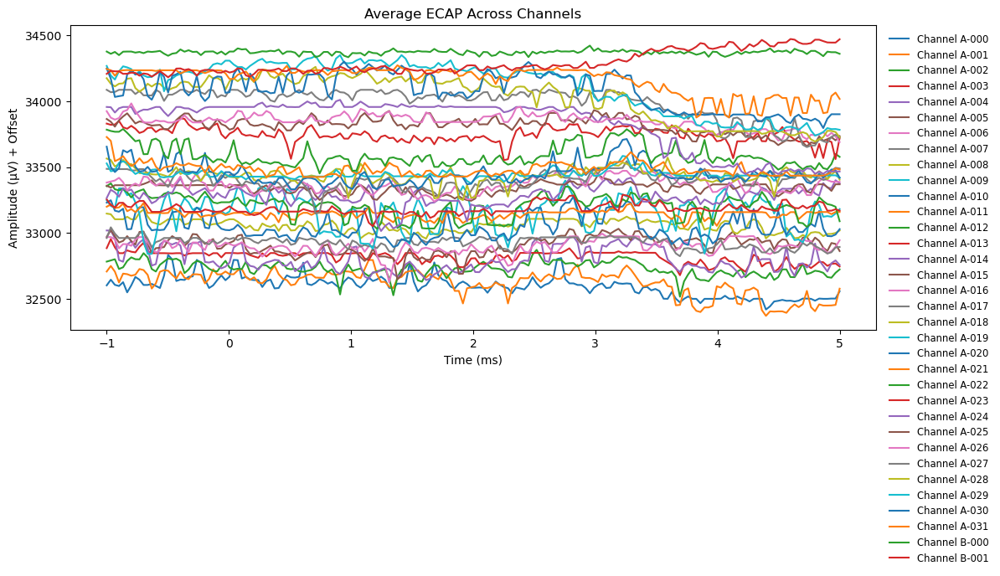

Error processing Kilosort outputs: [WinError 3] The system cannot find the path specified: 'D:\\Data\\CMU.80 Data\\88 Analyzed Data\\binary'
Kilosort results not found for trial DRGS_11_240911_160638.


In [28]:
# main.py

from pathlib import Path
import yaml

# Import your classes and functions
from automations import RM1
from automations import SpikeInterface_wrapper
from automations import Kilosort_wrapper
# Import analysis functions
# (Assuming you have saved the functions above in a file named analysis_functions.py)
from automations.analysis_functions import (
    analyze_rat_trials,
    analyze_trial,
    extract_stimulation_times,
    perform_sta,
    plot_average_ecap,
    analyze_kilosort_results,
    compute_firing_rates,
    plot_firing_rates
)

# Load configuration (if using a config file)
# with open('config.yaml', 'r') as file:
#     config = yaml.safe_load(file)
    
# data_directory = Path(config['data_directory'])
# save_directory = Path(config['save_directory'])
# probe_directory = Path(config['probe_directory'])
# rats_to_analyze = config['rats_to_analyze']

# For this example, we'll define the paths directly
data_directory = Path(r'D:\Data\CMU.80 Data\82 External Data\82.002 Sample Rat Data from RM1 Project')
save_directory = Path(r'D:\Data\CMU.80 Data\88 Analyzed Data')
probe_directory = Path(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.001 A1x32-Edge-5mm-20-177-A32\A1x32-Edge-5mm-20-177-A32.prb')

# Define the rats and their trials
rats_to_analyze = {
    'DW333': ['VF_DRG_1_241115_145120', 'VF_DRG_1_241115_145739'],
    'DW323': ['DRGS_11_240911_160638'],
    # Add more rats and trials as needed
}

# Loop over each rat and their trials
for rat_id, trial_names in rats_to_analyze.items():
    analyze_rat_trials(rat_id, trial_names, data_directory, save_directory, probe_directory)
